In [14]:
import numpy as np
import time
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
import xgboost as xgb
import shap
from sklearn.model_selection import cross_val_score
import matplotlib.pyplot as plt
from sklearn import metrics
import pandas as pd

!pip install xlsxwriter

import xlsxwriter

In [16]:
def read_xlsx(file):
    file_read = pd.ExcelFile(file)
    df = pd.read_excel(file) #, header=None
    rows, columns = df.shape
    #print(rows, columns)
    return df


def shap_regressor(regressor, data_train, data_y, data_test):
    regressor.fit(data_train, data_y)
    explainer = shap.TreeExplainer(regressor)
    shap_values = explainer.shap_values(data_test)
    return shap_values


def plot_summary_shap_values(shap_values, data_test):
    shap.initjs()
    for j in range(0,32):
        shap.summary_plot(shap_values[..., j], data_test, max_display=data_test.shape[1])

In [17]:
data_train = read_xlsx('data_train.xlsx')
data_y = read_xlsx('data_y.xlsx')
data_test = read_xlsx('data_test.xlsx')

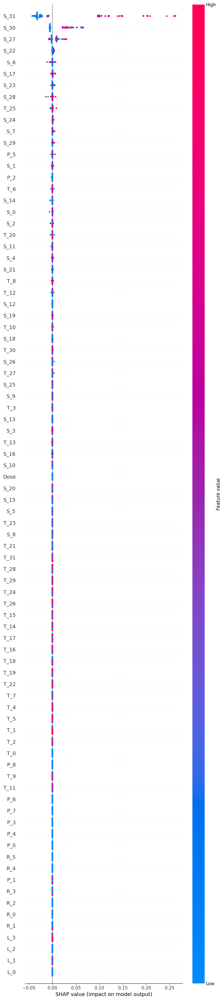

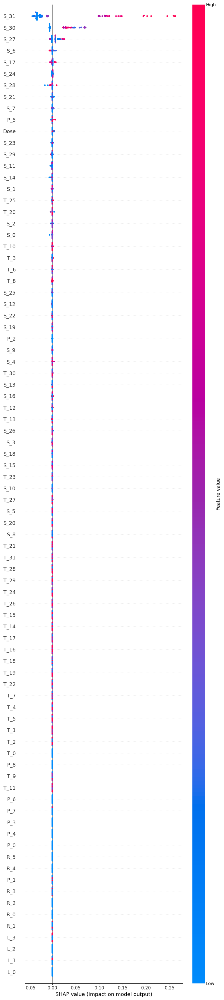

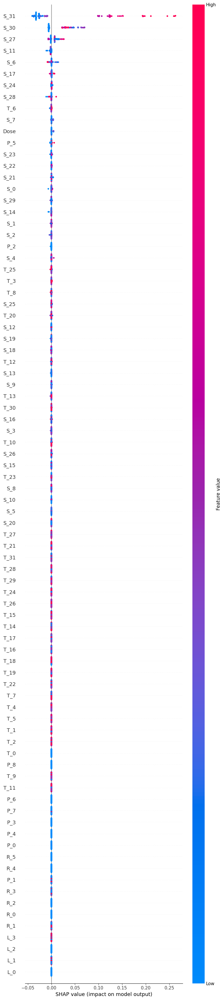

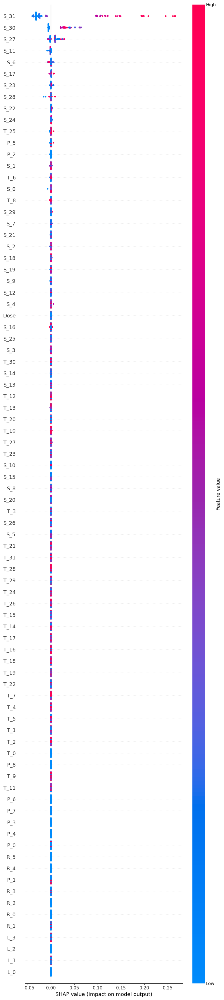

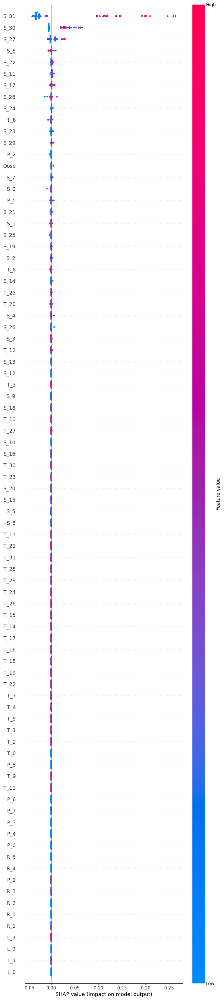

...

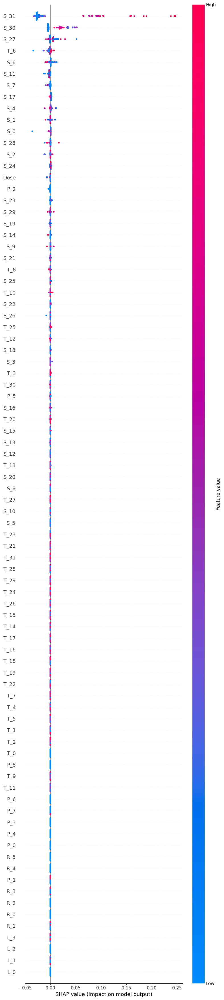

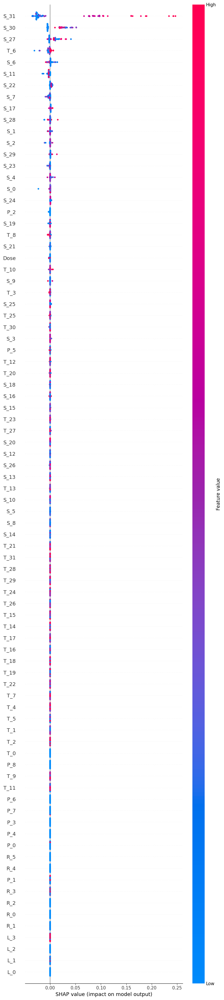

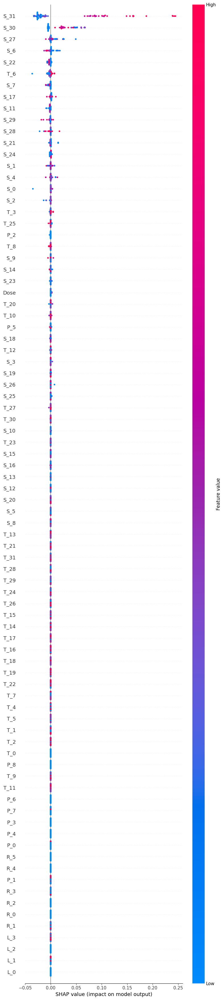

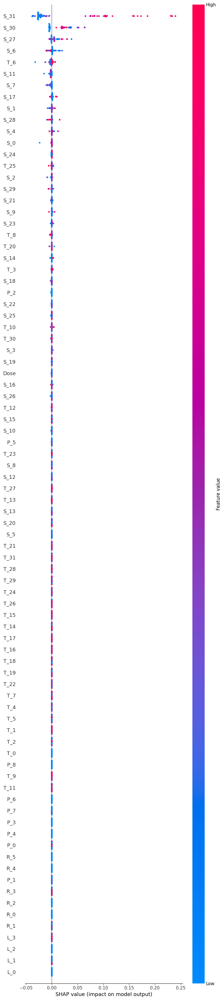

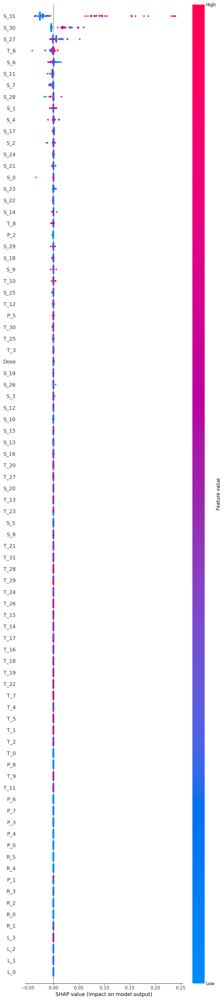

In [18]:
regressor_decision_tree = DecisionTreeRegressor(max_depth=10, min_samples_leaf=1, random_state=0)
shap_values_decision_tree = shap_regressor(regressor_decision_tree, data_train, data_y, data_test)
plot_summary_shap_values(shap_values_decision_tree, data_test)

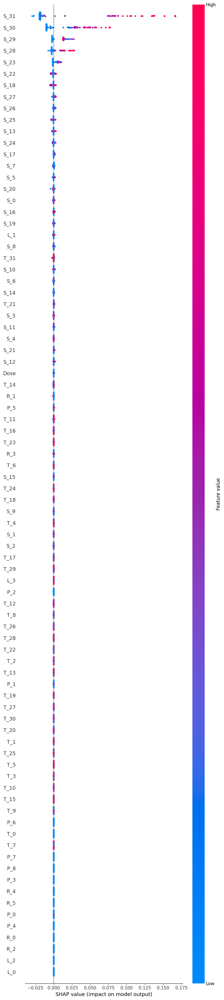

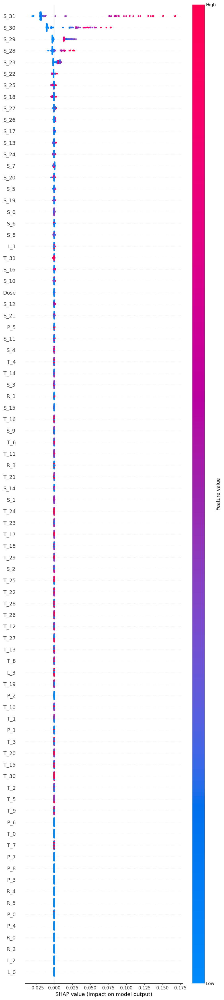

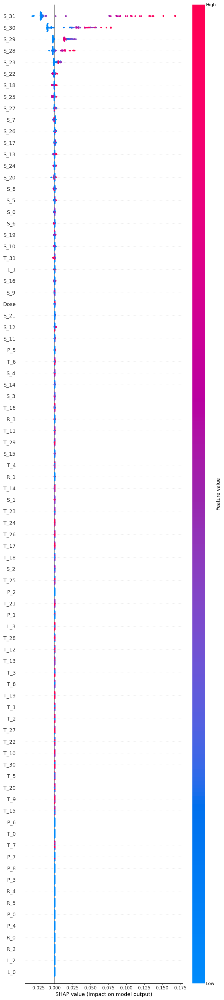

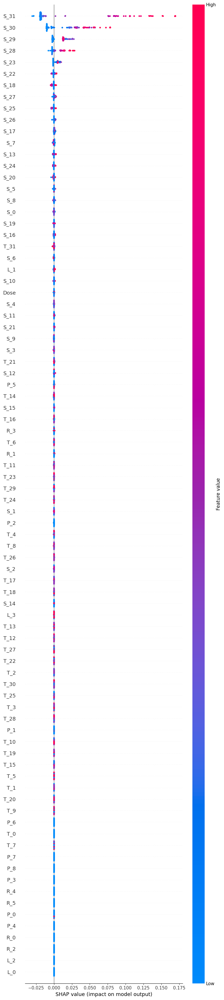

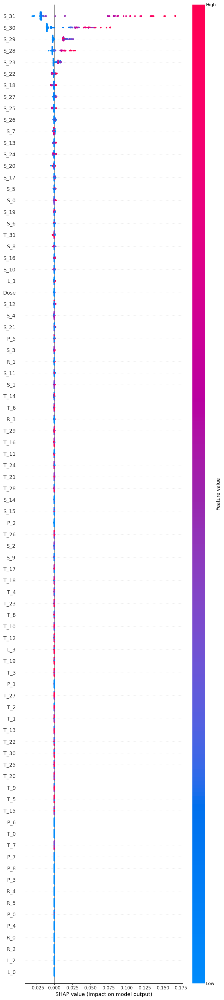

...

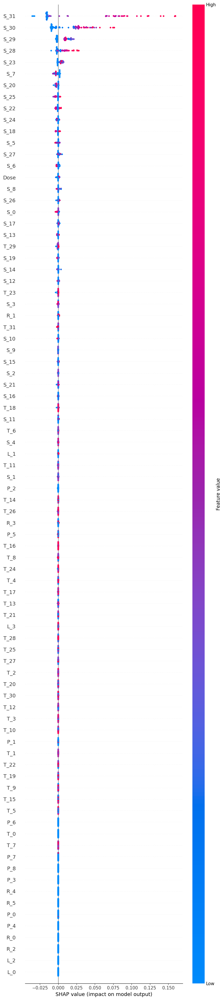

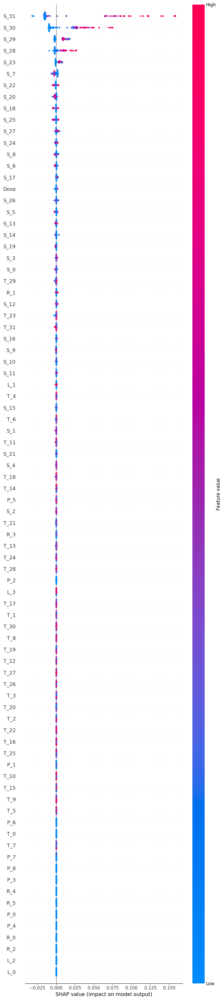

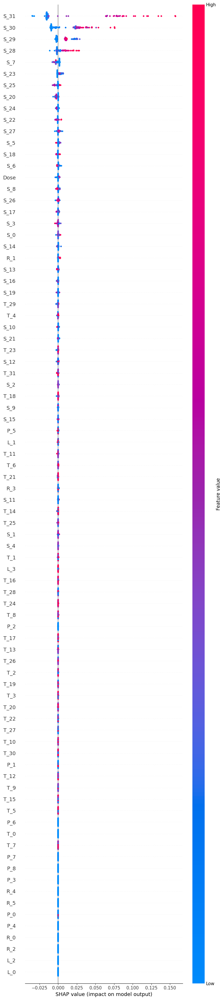

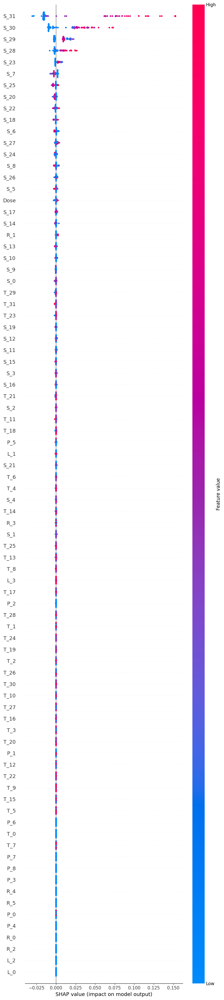

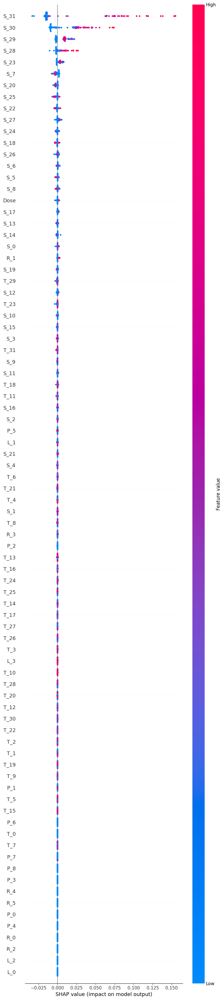

In [19]:
regressor_random_forest = RandomForestRegressor(n_estimators=10, max_depth=10, min_samples_leaf=1, random_state=0)
shap_values_random_forest = shap_regressor(regressor_random_forest, data_train, data_y, data_test)
plot_summary_shap_values(shap_values_random_forest, data_test)